# phase 3 


First, we'll assess whether our dataset is balanced or imbalanced. In Phase 2, after preprocessing our dataset, we'll proceed with applying classification and clustering methods. Finally, we'll evaluate the performance of these methods.


In [17]:
import pandas as pd
df = pd.read_csv("Processed_dataset.csv",sep=",")
x = df['Flexibility Level']

num_high = x[x == 1].count()
num_low = x[x == 0].count()

total = num_high + num_low
percentage_high = (num_high / total) * 100
percentage_low = (num_low / total) * 100

print("Number of high :", num_high)
print("Number of low:", num_low)
print("___")
print("Percentage of high : {:.2f}%".format(percentage_high))
print("Percentage of low : {:.2f}%".format(percentage_low))

Number of high : 123
Number of low: 123
___
Percentage of high : 50.00%
Percentage of low : 50.00%


# 1-  loading data : 

In [19]:
import pandas as pd
from scipy import stats
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree

df = pd.read_csv("Processed_dataset.csv")
df

,Education Level,Institution Type,Gender,Age,Device,IT Student,Location,Financial Condition,Internet Type,Network Type,Flexibility Level
0,2,0,1,0.777778,2,0,1,0,1,2,1
1,2,0,0,0.777778,1,0,1,0,0,2,1
2,0,1,0,0.500000,1,0,1,0,1,2,1
3,1,0,0,0.111111,1,0,1,0,0,2,1
4,1,0,0,0.500000,1,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
241,0,1,0,0.500000,1,0,0,0,0,2,0
242,2,1,1,0.777778,1,0,0,0,0,1,0
243,1,1,0,0.289917,1,0,1,0,1,2,0
244,2,1,0,0.777778,1,0,1,0,1,2,0


# 2- Feature Selection:

In [21]:
fn= df.keys().tolist()[:-1]
X= df[fn]
y=df['Flexibility Level']
X

,Education Level,Institution Type,Gender,Age,Device,IT Student,Location,Financial Condition,Internet Type,Network Type
0,2,0,1,0.777778,2,0,1,0,1,2
1,2,0,0,0.777778,1,0,1,0,0,2
2,0,1,0,0.500000,1,0,1,0,1,2
3,1,0,0,0.111111,1,0,1,0,0,2
4,1,0,0,0.500000,1,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...
241,0,1,0,0.500000,1,0,0,0,0,2
242,2,1,1,0.777778,1,0,0,0,0,1
243,1,1,0,0.289917,1,0,1,0,1,2
244,2,1,0,0.777778,1,0,1,0,1,2


# 3- Splitting Data into: 

Now, we'll conduct experiments to determine the optimal size for splitting our dataset into training and testing sets. This process will help us choose the appropriate ratio for training and testing data, ensuring reliable model evaluation.

## Splitting Data into: 70% Training and 30% Test


- Information Gain (entropy):

In [22]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### - DecisionTree

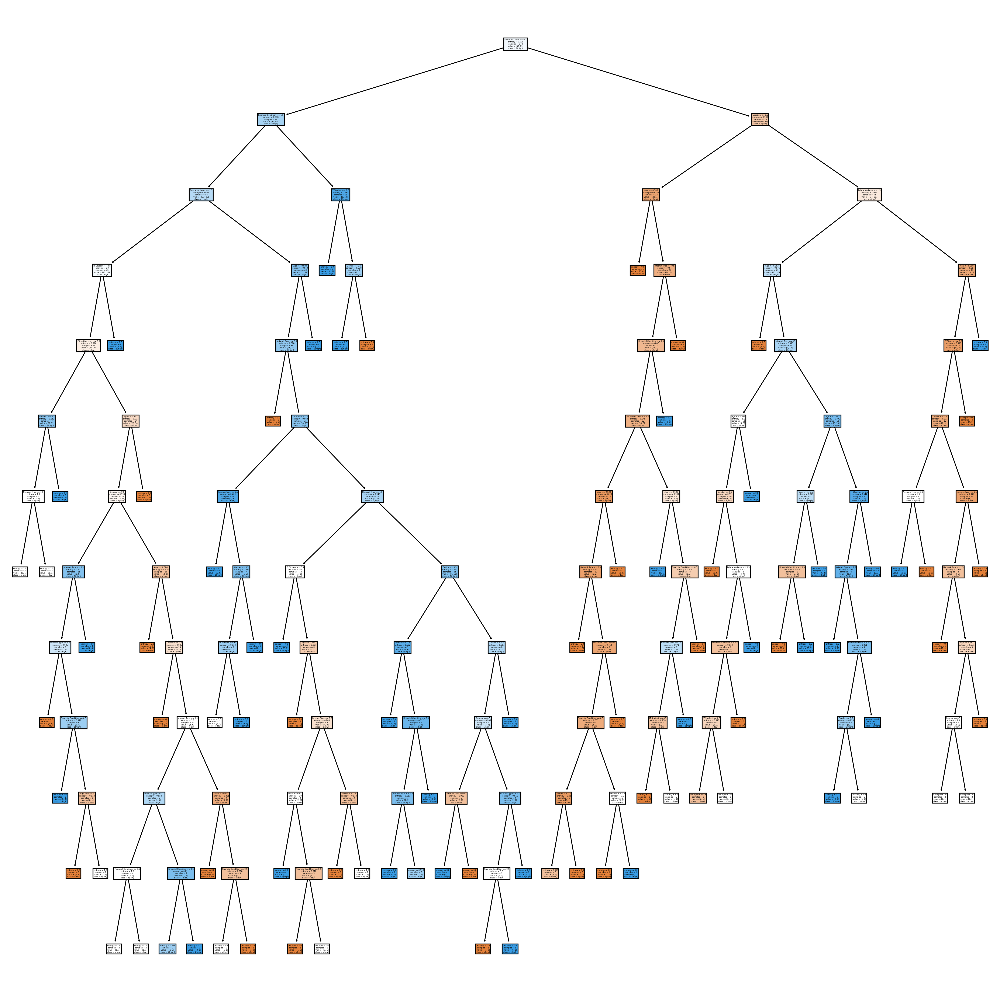

In [39]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[27 13]
 [16 18]]


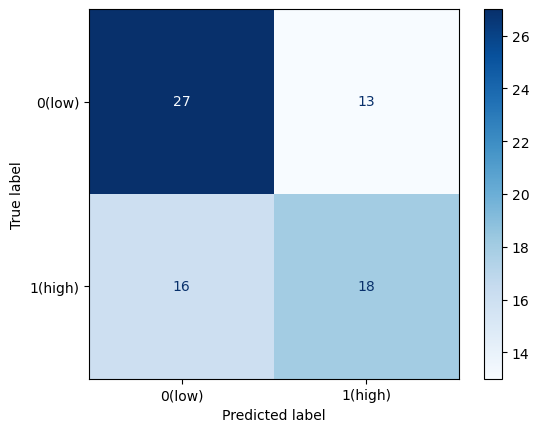

In [25]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

### now lets evaluatie this spliting 

In [40]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.6081081081081081


In [34]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[27 13]
 [16 18]]
Accuracy: 0.6081081081081081
Error Rate: 0.3918918918918919
Sensitivity: 0.5294117647058824
Specificity: 0.675
Precision: 0.5806451612903226


- Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (true positives and true negatives) to the total number of instances.
In this case, the accuracy is approximately 60.81%. This means that the model correctly predicts the class of about 60.81% of the instances.


- Error rate is the complement of accuracy and represents the proportion of misclassified instances.
Here, the error rate is approximately 39.19%, indicating that about 39.19% of the instances are misclassified by the model.


- Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
In this case, the sensitivity is approximately 52.94%, indicating that the model correctly identifies about 52.94% of the actual positive instances.

- Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 67.5%, indicating that the model correctly identifies about 67.5% of the actual negative instances.

- Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is approximately 58.06%, indicating that about 58.06% of the instances predicted as positive are actually positive.

### - Gini Index:

In [41]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

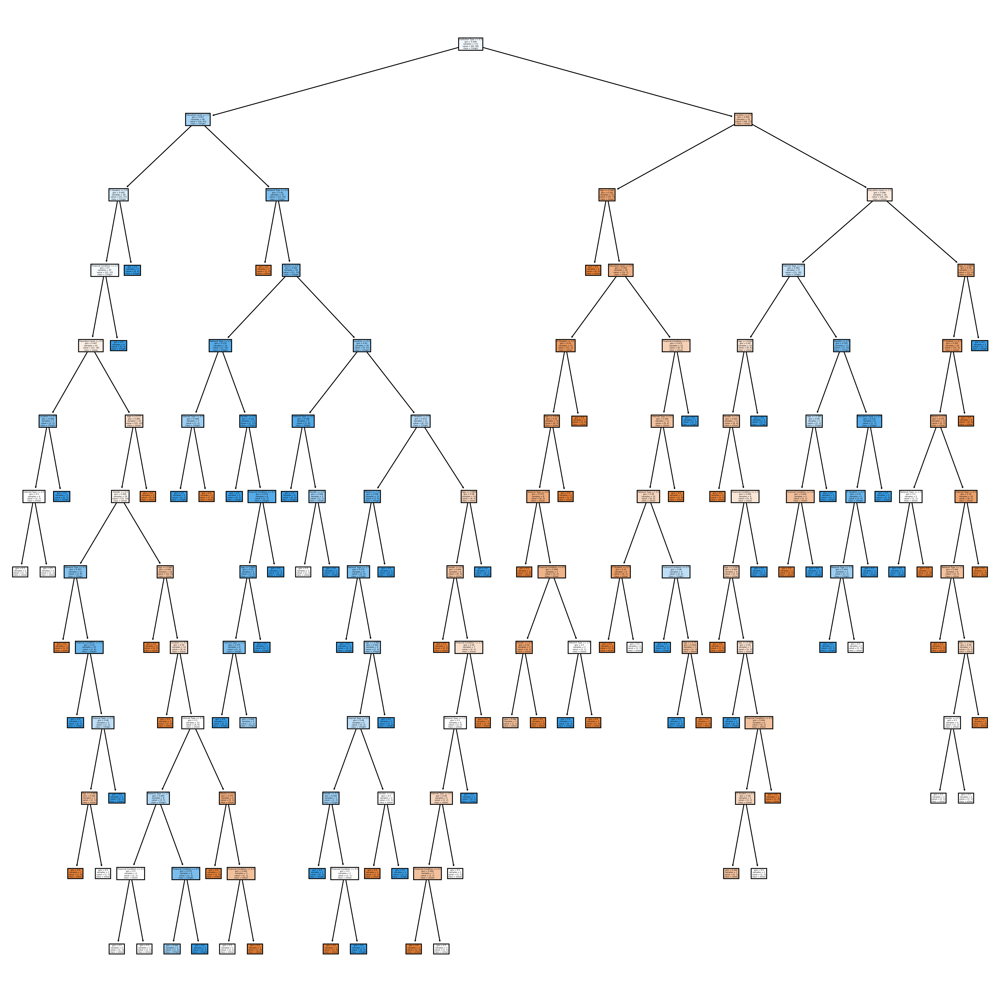

In [45]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[27 13]
 [15 19]]


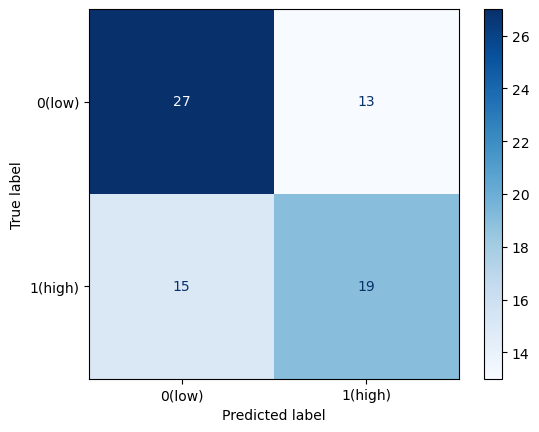

In [43]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [46]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[27 13]
 [15 19]]
Accuracy: 0.6216216216216216
Error Rate: 0.3783783783783784
Sensitivity: 0.5588235294117647
Specificity: 0.675
Precision: 0.59375


Accuracy:
Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (true positives and true negatives) to the total number of instances.
In this case, the accuracy is approximately 62.16%. This means that the model correctly predicts the class of about 62.16% of the instances.
- - - - -
Error Rate:
Error rate is the complement of accuracy and represents the proportion of misclassified instances.
Here, the error rate is approximately 37.84%, indicating that about 37.84% of the instances are misclassified by the model.
- - - - -
Sensitivity (True Positive Rate, Recall):
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
In this case, the sensitivity is approximately 55.88%, indicating that the model correctly identifies about 55.88% of the actual positive instances.
- - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 67.5%, indicating that the model correctly identifies about 67.5% of the actual negative instances.
- - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is approximately 59.38%, indicating that about 59.38% of the instances predicted as positive are actually positive.

## Splitting Data into: 60% Training and 40% Test

### - Information Gain (entropy):

In [49]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

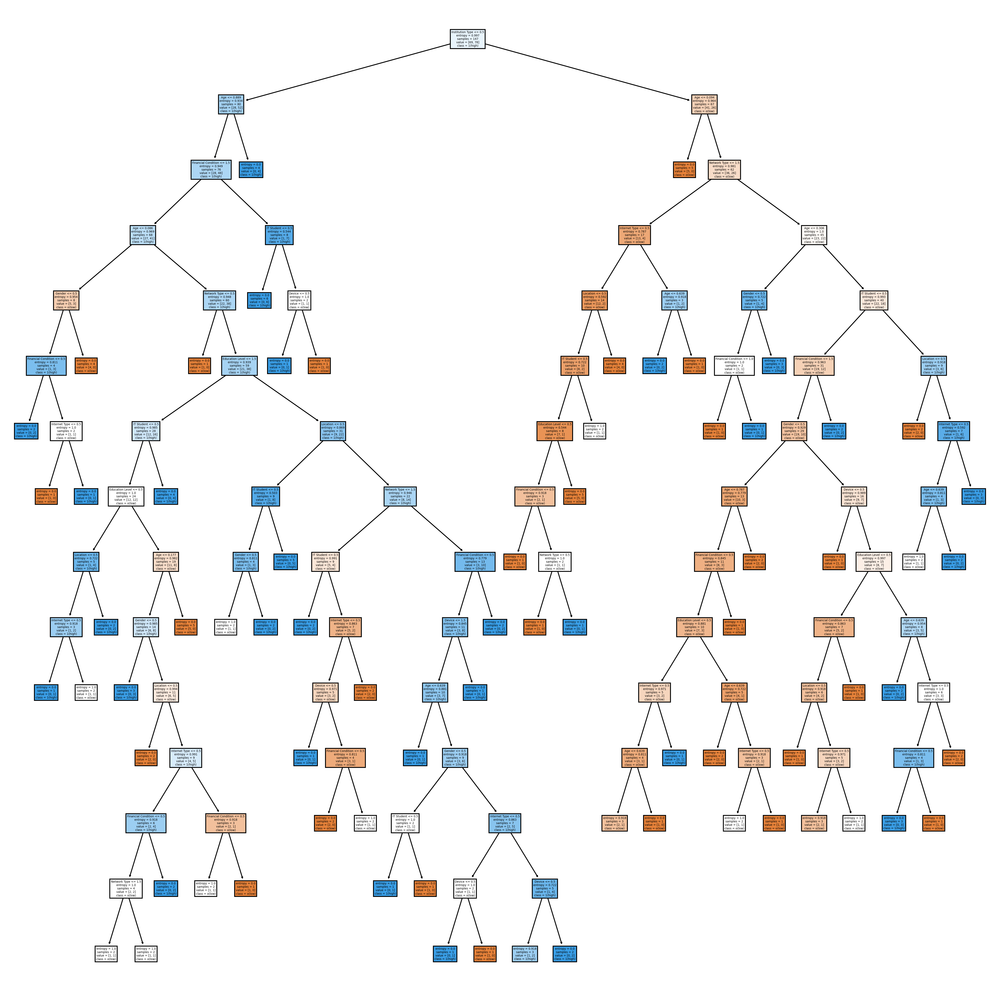

In [50]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[33 21]
 [17 28]]


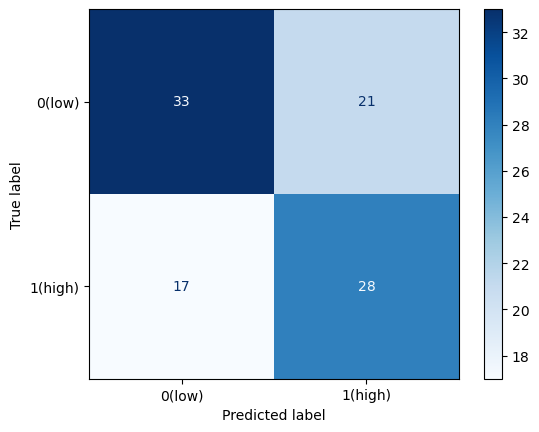

In [52]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [53]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[33 21]
 [17 28]]
Accuracy: 0.6161616161616161
Error Rate: 0.38383838383838387
Sensitivity: 0.6222222222222222
Specificity: 0.6111111111111112
Precision: 0.5714285714285714


Accuracy:
Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (TP and TN) to the total number of instances.
Here, the accuracy is approximately 61.62%. This means that the model correctly predicts the class of about 61.62% of the instances.
- - - - -
Error Rate:
Error rate is the complement of accuracy and represents the proportion of misclassified instances.
In this case, the error rate is approximately 38.38%, indicating that about 38.38% of the instances are misclassified by the model.
- - - - -
Sensitivity (True Positive Rate, Recall):
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
Here, the sensitivity is approximately 62.22%, indicating that the model correctly identifies about 62.22% of the actual positive instances.
- - - - - 
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 61.11%, indicating that the model correctly identifies about 61.11% of the actual negative instances.
- - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is approximately 57.14%, indicating that about 57.14% of the instances predicted as positive are actually positive.


## Gini Index:

In [54]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

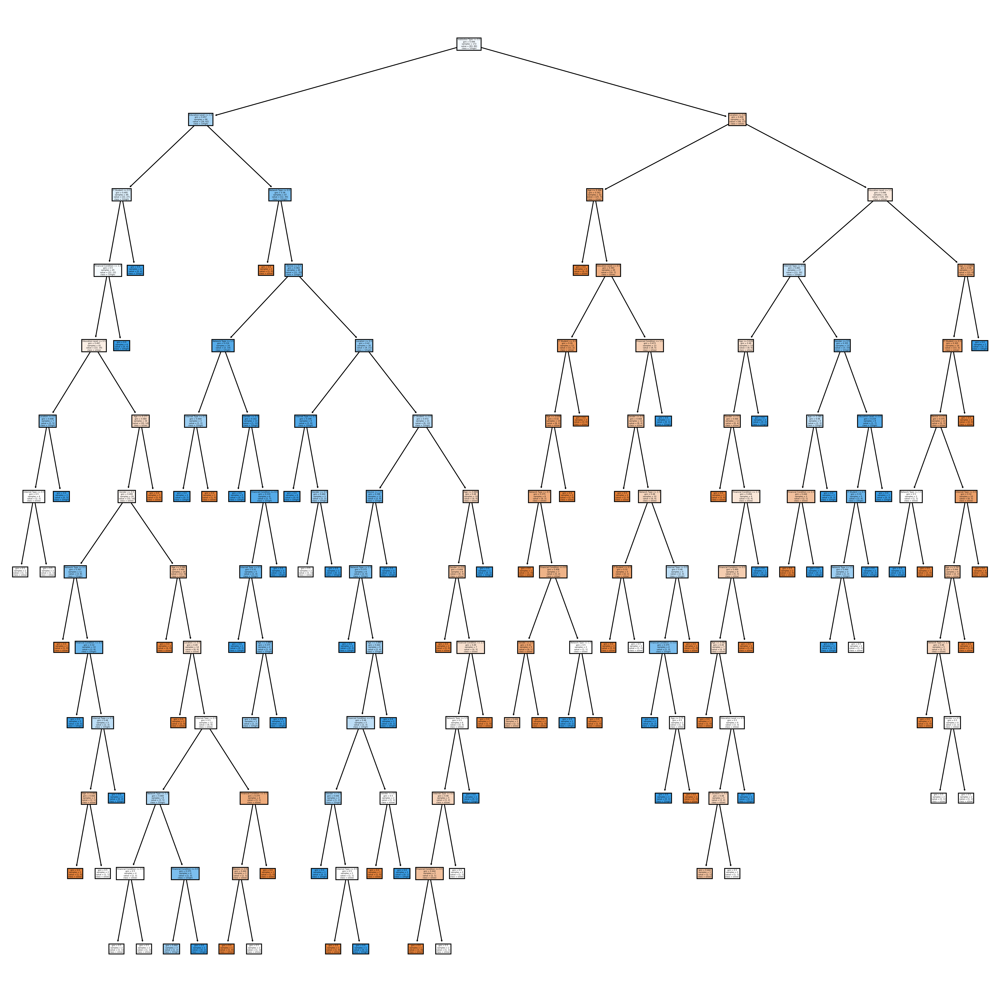

In [56]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix:

[[27 13]
 [15 19]]


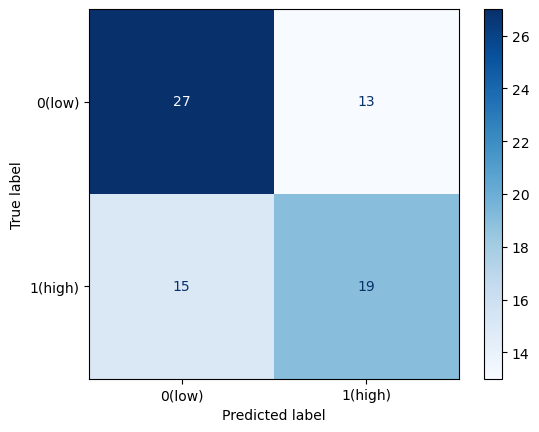

In [57]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [59]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[27 13]
 [15 19]]
Accuracy: 0.6216216216216216
Error Rate: 0.3783783783783784
Sensitivity: 0.5588235294117647
Specificity: 0.675
Precision: 0.59375


Accuracy:
Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (TP and TN) to the total number of instances.
Here, the accuracy is approximately 62.16%. This means that the model correctly predicts the class of about 62.16% of the instances.
- - - - -
Error Rate:
Error rate is the complement of accuracy and represents the proportion of misclassified instances.
In this case, the error rate is approximately 37.84%, indicating that about 37.84% of the instances are misclassified by the model.
- - - - -
Sensitivity (True Positive Rate, Recall):
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
Here, the sensitivity is approximately 55.88%, indicating that the model correctly identifies about 55.88% of the actual positive instances.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 67.5%, indicating that the model correctly identifies about 67.5% of the actual negative instances.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is approximately 59.38%, indicating that about 59.38% of the instances predicted as positive are actually positive.

## Splitting Data into: 80% Training and 20% Test

### - Information Gain (entropy):

In [62]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

## decision tree : 

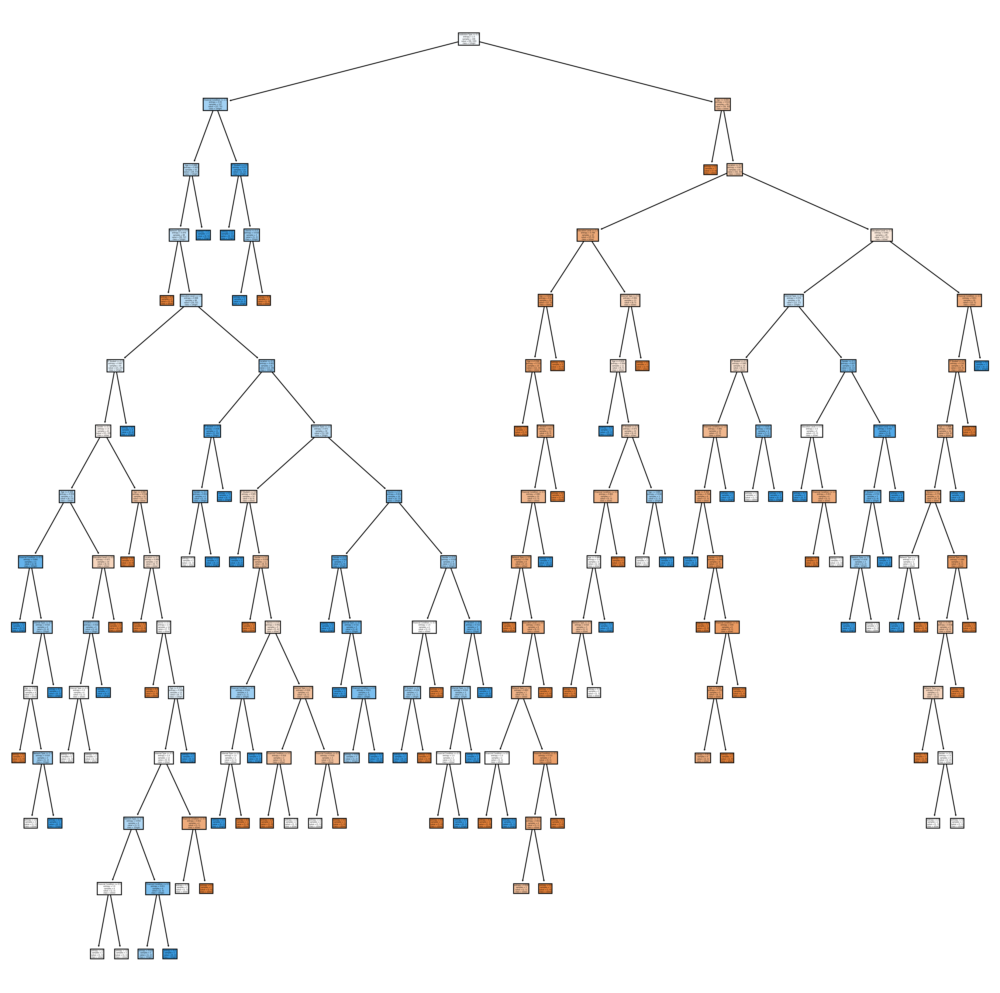

In [64]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

## confusion matrix:

[[18  9]
 [12 11]]


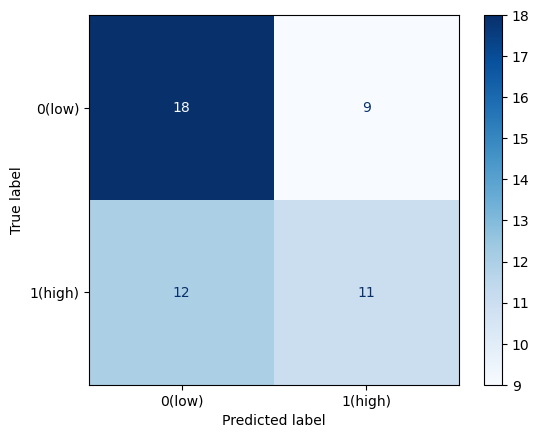

In [66]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [67]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[18  9]
 [12 11]]
Accuracy: 0.58
Error Rate: 0.42000000000000004
Sensitivity: 0.4782608695652174
Specificity: 0.6666666666666666
Precision: 0.55


Accuracy:
Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (TP and TN) to the total number of instances.
Here, the accuracy is 58.00%. This means that the model correctly predicts the class of about 58.00% of the instances.
- - - - -
Error Rate:
Error rate is the complement of accuracy and represents the proportion of misclassified instances.
In this case, the error rate is 42.00%, indicating that about 42.00% of the instances are misclassified by the model.
- - - - -
Sensitivity (True Positive Rate, Recall):
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
Here, the sensitivity is approximately 47.83%, indicating that the model correctly identifies about 47.83% of the actual positive instances.
- - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 66.67%, indicating that the model correctly identifies about 66.67% of the actual negative instances.
- - - - - 
Precision (Positive Predictive Value):
Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is 55.00%, indicating that about 55.00% of the instances predicted as positive are actually positive.

### Gini Index:

In [73]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

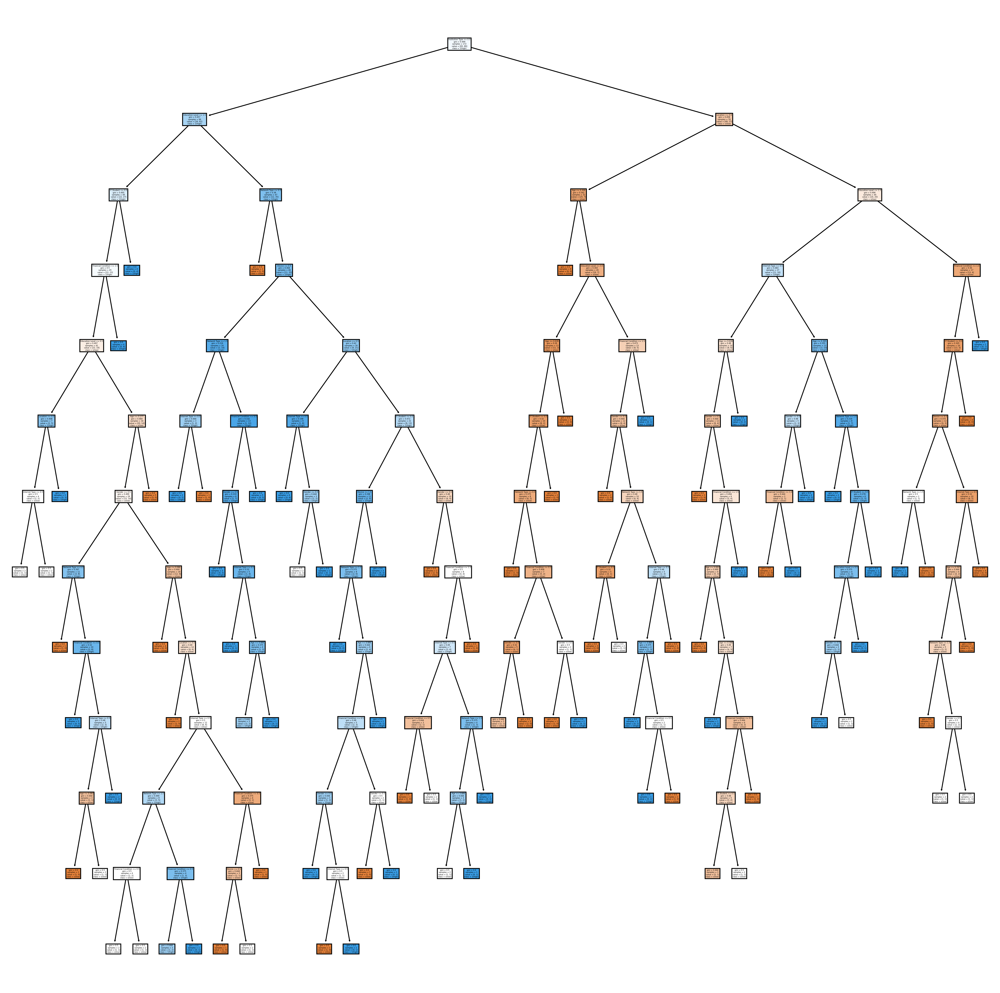

In [74]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix:

[[31  9]
 [16 18]]


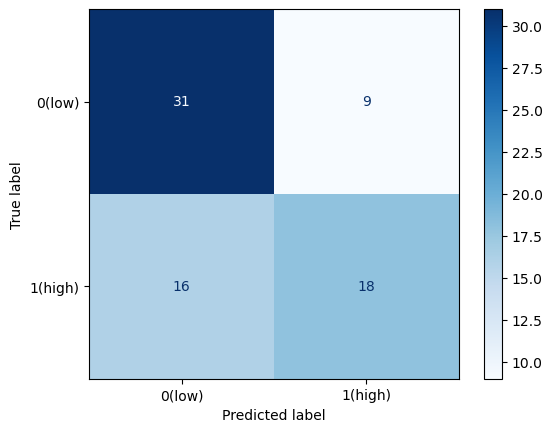

In [75]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [76]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[31  9]
 [16 18]]
Accuracy: 0.6621621621621622
Error Rate: 0.33783783783783783
Sensitivity: 0.5294117647058824
Specificity: 0.775
Precision: 0.6666666666666666


Accuracy:
Accuracy measures the overall correctness of the classification model. It is calculated as the ratio of correctly classified instances (TP and TN) to the total number of instances.
Here, the accuracy is 66.22%. This means that the model correctly predicts the class of about 66.22% of the instances.
- - - - -
Error Rate:
Error rate is the complement of accuracy and represents the proportion of misclassified instances.
In this case, the error rate is approximately 33.78%, indicating that about 33.78% of the instances are misclassified by the model.
- - - - - -
Sensitivity (True Positive Rate, Recall):
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model.
Here, the sensitivity is approximately 52.94%, indicating that the model correctly identifies about 52.94% of the actual positive instances.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified by the model.
Here, the specificity is approximately 77.50%, indicating that the model correctly identifies about 77.50% of the actual negative instances.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of instances predicted as positive that are actually positive.
In this case, the precision is approximately 66.67%, indicating that about 66.67% of the instances predicted as positive are actually positive.

### Results - Entropy 

| Metric| 70 %training set 30% testing set | 60 %training set 40% testing set |80 %training set 20% testing set|
| --- | --- | --- |--- |
| Accuracy |   0.608  |   0.616  |   0.58 |
| Error Rate |   0.39   |  0.3838   |  0.420   |
| Sensitivity |   0.529  |   0.6222 |  0.478  |
| Specificity  |    0.675  |   0.61   |  0.666   |
| Precision  |    0.5806  |    0.5714  |  0.55   |

Accuracy:
Accuracy measures the overall correctness of the classification model. It indicates the proportion of correctly classified instances out of all instances.
The accuracy values obtained are:
70% training set, 30% testing set: 0.608
60% training set, 40% testing set: 0.616
80% training set, 20% testing set: 0.58
Among the configurations, the highest accuracy is achieved with a 60% training set and 40% testing set. However, the difference in accuracy between the configurations is relatively small.
- - - - - -
Error Rate:
Error rate is the proportion of misclassified instances out of all instances. It is the complement of accuracy.
The error rate values obtained are:
70% training set, 30% testing set: 0.39
60% training set, 40% testing set: 0.3838
80% training set, 20% testing set: 0.42
The configuration with a 60% training set and 40% testing set has the lowest error rate, indicating better performance in terms of misclassification.
- - - - - -
Sensitivity:
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model (true positives).
The sensitivity values obtained are:
70% training set, 30% testing set: 0.529
60% training set, 40% testing set: 0.6222
80% training set, 20% testing set: 0.478
Sensitivity is highest with a 60% training set and 40% testing set, indicating better performance in correctly identifying positive instances.
- - - - - - - -
Specificity:
Specificity measures the proportion of actual negative instances that are correctly identified by the model (true negatives).
The specificity values obtained are:
70% training set, 30% testing set: 0.675
60% training set, 40% testing set: 0.61
80% training set, 20% testing set: 0.666
Specificity is highest with a 70% training set and 30% testing set, indicating better performance in correctly identifying negative instances.
- - - - - - -
Precision:
Precision measures the proportion of instances predicted as positive that are actually positive (true positives out of all positive predictions).
The precision values obtained are:
70% training set, 30% testing set: 0.5806
60% training set, 40% testing set: 0.5714
80% training set, 20% testing set: 0.55
Precision is highest with a 70% training set and 30% testing set, indicating a higher proportion of true positive predictions out of all positive predictions.
- - - - - - - -
Based on these results, we can conclude that the configuration with a 60% training set and 40% testing set generally performs better in terms of accuracy, error rate, sensitivity, specificity, and precision. This suggests that a slightly larger training set may contribute to better model performance. However, it's essential to consider the trade-offs between training and testing set sizes, as larger training sets may also require more computational resources and time for training. Additionally, the choice of the optimal training and testing set sizes depends on the specific characteristics of the dataset and the requirements of the problem at hand.

### Results - Gini 

| Metric| 70 %training set 30% testing set | 60 %training set 40% testing set |80 %training set 20% testing set|
| --- | --- | --- |--- |
| Accuracy |   0.6216  |  0.6216  |  0.662 |
| Error Rate |  0.378   | 0.3783   |  0.337   |
| Sensitivity |   0.5588  |  0.558 |   0.529  |
| Specificity  |    0.675  |  0.675   |  0.775   |
| Precision  |    0.593  |    0.59375  |  0.6666   |

Accuracy:
Accuracy measures the overall correctness of the classification model. It indicates the proportion of correctly classified instances out of all instances.
The accuracy values obtained are:
70% training set, 30% testing set: 0.6216
60% training set, 40% testing set: 0.6216
80% training set, 20% testing set: 0.662
The configuration with an 80% training set and 20% testing set has the highest accuracy, suggesting that a larger training set contributes to better overall performance.
- - - - - -
Error Rate:
Error rate is the proportion of misclassified instances out of all instances. It is the complement of accuracy.
The error rate values obtained are:
70% training set, 30% testing set: 0.378
60% training set, 40% testing set: 0.3783
80% training set, 20% testing set: 0.337
The configuration with an 80% training set and 20% testing set has the lowest error rate, indicating better performance in terms of misclassification.
- - - - - - -
Sensitivity:
Sensitivity measures the proportion of actual positive instances that are correctly identified by the model (true positives).
The sensitivity values obtained are:
70% training set, 30% testing set: 0.5588
60% training set, 40% testing set: 0.558
80% training set, 20% testing set: 0.529
Sensitivity is highest with a 70% training set and 30% testing set, but the difference in sensitivity across configurations is relatively small.
- - - - - - -
Specificity:
Specificity measures the proportion of actual negative instances that are correctly identified by the model (true negatives).
The specificity values obtained are:
70% training set, 30% testing set: 0.675
60% training set, 40% testing set: 0.675
80% training set, 20% testing set: 0.775
Specificity is highest with an 80% training set and 20% testing set, indicating better performance in correctly identifying negative instances.
- - - - - - -
Precision:
Precision measures the proportion of instances predicted as positive that are actually positive (true positives out of all positive predictions).
The precision values obtained are:
70% training set, 30% testing set: 0.593
60% training set, 40% testing set: 0.59375
80% training set, 20% testing set: 0.6666
Precision is highest with an 80% training set and 20% testing set, indicating a higher proportion of true positive predictions out of all positive predictions.
- - - - - -- - -
Based on these results, we can conclude that the configuration with an 80% training set and 20% testing set generally performs better in terms of accuracy, error rate, sensitivity, specificity, and precision. This suggests that a larger training set may contribute to better model performance. However, as always, it's essential to consider the specific characteristics of the dataset and the requirements of the problem when determining the optimal training and testing set sizes.

# Clustering

In this task, we use the K-means clustering algorithm to group the students into clusters with different number of clusters. We evaluate the K-Means algorithms using  silhouette coefficient and Total Within-Cluster Sum of Squares and we plot the Elbow curve to determine the optimal number of clusters.

##  k-means

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the preprocessed dataset
df = pd.read_csv("Processed_dataset.csv")  

# Extract the features (excluding the target variable, if any)
features = df.drop('Flexibility Level', axis=1) 

# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)  # Create a new DataFrame with the scaled features

df_scaled = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
print(df_scaled.head())


Scaled DataFrame:
   Education Level  Institution Type    Gender       Age    Device  \
0         0.963100         -0.906765  0.834597  0.815428  2.792654   
1         0.963100         -0.906765 -1.198183  0.815428  0.330314   
2        -1.612146          1.102822 -1.198183 -0.092652  0.330314   
3        -0.324523         -0.906765 -1.198183 -1.363963  0.330314   
4        -0.324523         -0.906765 -1.198183 -0.092652  0.330314   

   IT Student  Location  Financial Condition  Internet Type  Network Type  
0   -0.649589  0.662266            -0.609711       1.139766      0.757122  
1   -0.649589  0.662266            -0.609711      -0.877373      0.757122  
2   -0.649589  0.662266            -0.609711       1.139766      0.757122  
3   -0.649589  0.662266            -0.609711      -0.877373      0.757122  
4   -0.649589  0.662266             0.890178      -0.877373     -1.016706  


#### - now we need to chosee 3 different sizes of K-means clustring

## Silhouette method

/lib/python3.11/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.11 is maybe too old for this OS.
  warnings.warn(


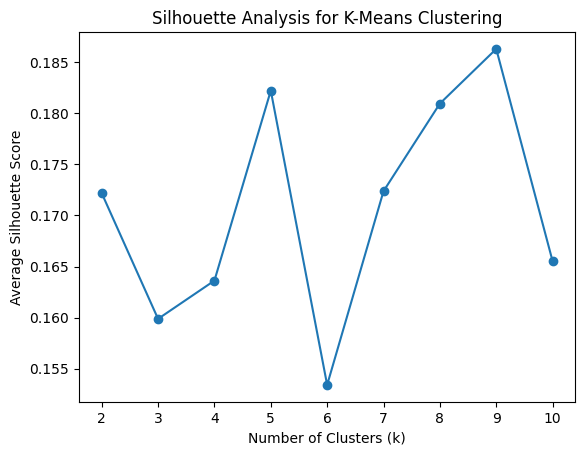

The highest average Silhouette score is 0.18629993253012986 with k=9.
The second highest average Silhouette score is 0.1822158323860628 with k=5.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Perform k-means clustering with different values of k
k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_result = kmeans.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, kmeans_result)
    silhouette_avg_values.append(silhouette_avg)

# Find the best number of clusters based on the highest average Silhouette score
best_k = k_values[np.argmax(silhouette_avg_values)]
best_score = max(silhouette_avg_values)

# Find the second highest average Silhouette score and its corresponding number of clusters
silhouette_avg_values_sorted = sorted(silhouette_avg_values, reverse=True)
second_best_score = silhouette_avg_values_sorted[1]
second_best_k = k_values[silhouette_avg_values.index(second_best_score)]

# Plot the silhouette scores for different values of k
plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

print(f"The highest average Silhouette score is {best_score} with k={best_k}.")
print(f"The second highest average Silhouette score is {second_best_score} with k={second_best_k}.")

## Elbow method

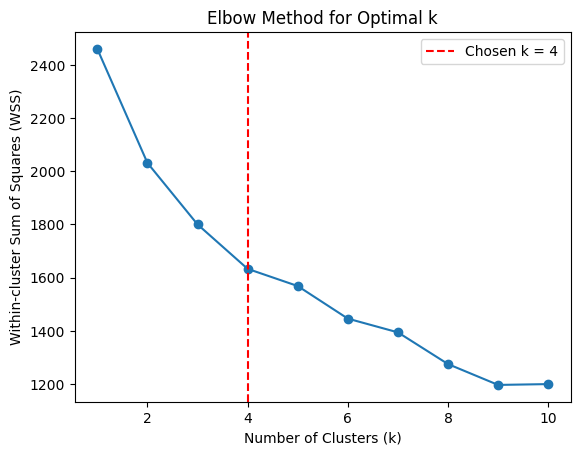

In [4]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import piplite
await piplite.install('kneed')
from kneed import KneeLocator

X = df_scaled

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform k-means clustering for different values of k
wss_values = []
k_values = range(1, 11)

for k in k_values:
    kmeans = make_pipeline(StandardScaler(), KMeans(n_clusters=k, n_init='auto'))
    kmeans.fit(X_scaled)
    wss_values.append(kmeans.named_steps['kmeans'].inertia_)

# Plot the elbow method
plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')

# Use KneeLocator to locate the turning point
knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
turning_point = knee.elbow

plt.axvline(x=turning_point, linestyle='--', color='red', label=f'Chosen k = {turning_point}')
plt.legend()
plt.show()

The best number of clusters in a dataset for K-means clustering can be found using the Elbow method. The number of clusters at which adding more clusters does not significantly reduce the inertia is represented by the Elbow point. The inertia measures how compact the clusters are. The Elbow technique aids in striking a balance between preventing overfitting and having a low moment of inertia.

## k= 9 

In [19]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(45)

# Perform K-means clustering for K=9 
kmeans = KMeans(n_clusters=9, random_state=45, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[-1.1400173   1.10282193  0.36028137 -0.32742951  0.33031395 -0.21178367
   0.51745064 -0.55971448  0.198434    0.52061141]
 [-0.77239165  1.10282193  0.746215   -0.14114309  0.33031395 -0.36406364
  -1.41552197  0.36847737 -0.78967176 -0.63109163]
 [ 0.96310002 -0.48810082  0.41110087  0.79272619 -2.13202639  1.17459852
   0.30022733 -0.48472005  0.63548077 -0.0558828 ]
 [-0.32452283 -0.73451442 -0.15275363 -1.28971977  0.25996137 -0.33687079
   0.66226618  0.46163815 -0.87737345 -0.15513272]
 [ 0.96310002 -0.30388871  0.02148467  1.03336733 -1.63955832  1.10163104
   0.66226618  2.09008849  0.93805161  0.75712186]
 [-0.63532835 -0.76817252 -0.42712889 -0.92298047 -0.09422749 -0.64958858
   0.512457    0.37297479  1.13976551  0.57362237]
 [ 0.96310002 -0.48048875  0.21860275  0.79891764  0.40493032  1.40676779
  -0.12763675 -0.2915526  -0.08274295 -0.801697  ]
 [-1.06030732  0.43295972 -1.00458533 -0.4007377   0.33031395 -0.64958858
  -1.30308755 -0.46686424 -0.87737

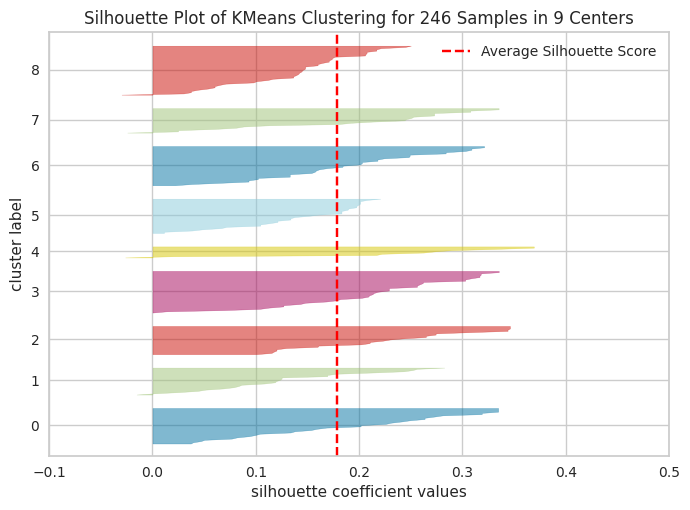

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [20]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=9,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [26]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=9
kmeans = KMeans(n_clusters=9, random_state=45, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1202.1795760464634
Average Silhouette Score: 0.1784279148509518


The Average Silhouette Score of 0.1784 in your case indicates a moderate level of clustering structure in the data. It suggests that the clusters are reasonably well-separated and distinct, with some overlap between clusters.
- - - - - - 
the WSS value of 1202.1796 suggests that the data points within the clusters have relatively small distances to their centroids, indicating compact clusters.

### k =5 

In [27]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(60)

# Perform K-means clustering for K=5
kmeans = KMeans(n_clusters=5, random_state=60, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 9.63100018e-01 -5.58951629e-01  3.26401697e-01  8.74802629e-01
  -1.18497241e+00  1.20266294e+00  4.95171327e-01  5.37014478e-02
   6.74271905e-01  6.65601632e-03]
 [-5.82047402e-01  1.06628399e+00 -5.24346109e-02  1.40275475e-01
   3.75083772e-01 -4.10785901e-01  2.67314712e-01 -5.00627963e-01
   3.95078954e-02  5.31361884e-01]
 [ 1.52374520e-01  5.81817991e-01  3.45223735e-01  2.27649763e-01
   3.75912843e-01 -9.88719294e-04 -1.38928727e+00 -8.19722245e-02
  -7.65310175e-01 -7.21068434e-01]
 [-3.47934157e-01 -8.70226762e-01 -6.43788847e-01 -6.24291022e-01
   1.06464826e-01 -4.50586347e-01  3.46305005e-01 -4.18815864e-01
   3.95078954e-02 -8.14151814e-02]
 [-2.38681309e-01 -4.37861153e-01  8.92440082e-02 -1.03873229e+00
   4.94469970e-01 -5.03653608e-01  5.17450641e-01  1.74011451e+00
   6.39580647e-02  4.61483798e-01]]

Cluster Labels:
[1 3 1 3 3 4 3 3 1 3 1 3 3 3 3 4 0 1 3 4 1 3 3 1 3 0 3 3 0 0 1 3 2 3 0 0 0
 0 4 0 2 4 1 3 3 2 0 1 3 3 2 2 1 2 1 3 3 1 2 3 2 2 0 0 

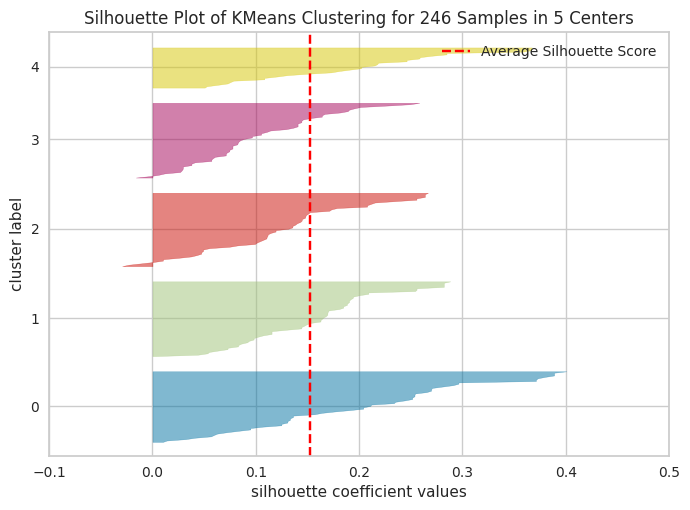

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [28]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [37]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=60, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1550.5511387646532
Average Silhouette Score: 0.1519666106128939


 the WSS value of 1550.5511 suggests that the clusters have a relatively larger spread compared to the previous scenario with WSS 1202.1796. It indicates that the data points within the clusters may be more dispersed, resulting in less compact clusters.
 - - - - - -
 the Average Silhouette Score of 0.152 suggests a moderate level of clustering structure in the data. It indicates that the clusters may not be as well-separated or distinct as in the previous case with a higher Average Silhouette Score of 0.1784.

### k = 8

In [31]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(90)

# Perform K-means clustering for K=8
kmeans = KMeans(n_clusters=8, random_state=90, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 0.96310002 -0.57866892  0.29528771  0.88214425 -1.2274932   1.31606609
   0.48494103  0.09431852  0.6457723  -0.03929087]
 [ 0.96310002  0.31334147  0.39900099  0.8478596   0.41825467  0.44492368
  -1.35480738 -0.07403631 -0.80533277 -0.44654738]
 [-0.32452283 -0.9067647  -0.44530189 -1.2159799   0.33031395 -0.24421367
   0.5818131  -0.16529936 -0.72795575 -0.62252241]
 [ 0.96310002  0.22362778 -0.37236649  0.87967702  0.48421022 -0.64958858
   0.32285476 -0.46909622  0.3833384   0.3690969 ]
 [-0.72071448 -0.21113856 -0.49452876 -0.68486973 -0.42732923 -0.64958858
   0.49517133 -0.60971076  1.06218324  0.62067352]
 [-1.12493704  0.83125617 -0.04444334 -0.36146565  0.33031395 -0.4721001
  -1.50996689 -0.04218539 -0.71382164 -0.53729343]
 [-0.221513   -0.50484737  0.02148467 -1.16256669  0.52730117 -0.5620276
   0.66226618  1.79011079  0.17153881  0.54426245]
 [-1.37803244  1.10282193  0.55739945 -0.09265159  0.44223851 -0.05258189
   0.66226618 -0.47335726 -0.3272446

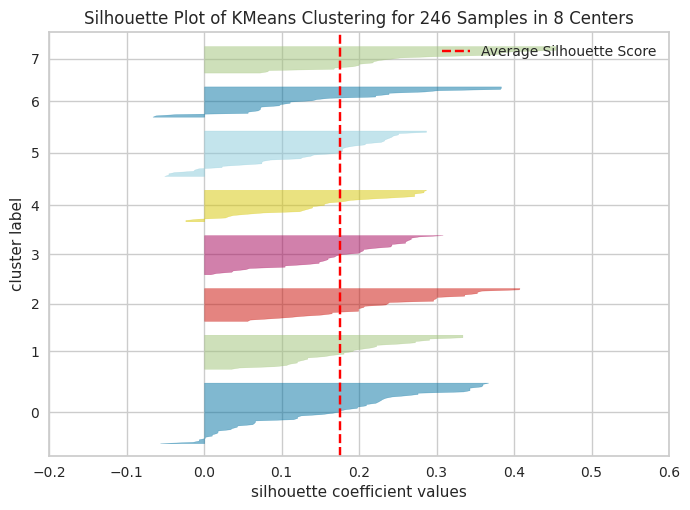

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [32]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=8, random_state=90, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1250.7346543811886
Average Silhouette Score: 0.1749348910251044


 the WSS value of 1250.7347 suggests that the clusters have a relatively smaller spread compared to the previous scenario with WSS 1550.5511. It indicates that the data points within the clusters are more closely packed around their centroids, resulting in more compact clusters.
 - - - - - -
 the Average Silhouette Score of 0.1749 suggests a moderate level of clustering structure in the data. It indicates that the clusters are reasonably well-separated and distinct, with some overlap between clusters.

# Evaluate the best models of Clustring:


|  Metric | K=9 | K=5 | K=8 | 
| --- | --- | --- |--- |
| Average Silhouette width           | 0.1784279148509518 | 0.1519666106128939 | 0.1749348910251044 |
| WSS | 1202.1795760464634 |  1550.5511387646532 | 1250.7346543811886 |

Average Silhouette Width:
The average silhouette width measures how similar an object is to its own cluster compared to other clusters. 
Higher values indicate better-defined clusters.
The values obtained are:
K=9: 0.1784
K=5: 0.1520
K=8: 0.1749
The highest average silhouette width is observed for K=9, indicating that the data points are better separated into clusters with this configuration.
- - - - - - - 
Within-Cluster Sum of Squares (WSS):
WSS measures the compactness of clusters. It represents the sum of squared distances between each data point and its assigned centroid.
The values obtained are:
K=9: 1202.1796
K=5: 1550.5511
K=8: 1250.7347
Lower values of WSS indicate tighter clusters. In this case, K=9 has the lowest WSS, suggesting more compact clusters compared to other configurations.
- - - - - - - 
Based on these metrics, we can conclude that K=9 is the optimal choice for this dataset, as it achieves both a higher average silhouette width and a lower WSS compared to other values of k. This indicates that the data points are better separated into distinct clusters with tighter grouping when K=9 is used for K-means clustering.